# Explore the User Habbits for Shared Bike in San Francisco
## by Mingshu Li

Bike-share has becoming increasingly popular for citizens and tourists in big cities, namely New York City, Chicago, San Francisco, etc. The ford-go bike data I'm exploring today has trip records in San Francisco during Feb 2019. The database recorded 183,412 trips from both subscribers and non-subscribers, it also give us the duration of each trip, the start/end stations and their altitude and longitude. In the age of global warming, biking regained its popularity among commuters like me. In this investigation, I want to explore the user habbits for the shared bike system in San Francisco to see if people take advantage of the system for commuting.

## Preliminary Wrangling
> During the preliminary wrangling, I explored the data on its dimensions. I seperated the datetime data for analysis purpose but didn't drop any null data.

In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

%matplotlib inline

In [2]:
bike = pd.read_csv('fordgobike-tripdata.csv')

In [3]:
# high-level overview of data shape and composition
print(bike.shape)
print(bike.dtypes)

(183412, 16)
duration_sec                 int64
start_time                  object
end_time                    object
start_station_id           float64
start_station_name          object
start_station_latitude     float64
start_station_longitude    float64
end_station_id             float64
end_station_name            object
end_station_latitude       float64
end_station_longitude      float64
bike_id                      int64
user_type                   object
member_birth_year          float64
member_gender               object
bike_share_for_all_trip     object
dtype: object


In [4]:
bike.head(5)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
0,52185,2019-02-28 17:32:10.1450,2019-03-01 08:01:55.9750,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,13.0,Commercial St at Montgomery St,37.794231,-122.402923,4902,Customer,1984.0,Male,No
1,42521,2019-02-28 18:53:21.7890,2019-03-01 06:42:03.0560,23.0,The Embarcadero at Steuart St,37.791464,-122.391034,81.0,Berry St at 4th St,37.775880,-122.393170,2535,Customer,NaN,NaN,No
2,61854,2019-02-28 12:13:13.2180,2019-03-01 05:24:08.1460,86.0,Market St at Dolores St,37.769305,-122.426826,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,5905,Customer,1972.0,Male,No
3,36490,2019-02-28 17:54:26.0100,2019-03-01 04:02:36.8420,375.0,Grove St at Masonic Ave,37.774836,-122.446546,70.0,Central Ave at Fell St,37.773311,-122.444293,6638,Subscriber,1989.0,Other,No
4,1585,2019-02-28 23:54:18.5490,2019-03-01 00:20:44.0740,7.0,Frank H Ogawa Plaza,37.804562,-122.271738,222.0,10th Ave at E 15th St,37.792714,-122.248780,4898,Subscriber,1974.0,Male,Yes


In [5]:
bike.start_time.max(),bike.start_time.min()

('2019-02-28 23:59:18.5480', '2019-02-01 00:00:20.6360')

In [6]:
# converting start and end time to datetime datatype
bike['start_time'] = pd.to_datetime(bike['start_time'])
bike['end_time'] = pd.to_datetime(bike['end_time'])

In [7]:
# add column for start/end date/time
bike['start_date'] = pd.to_datetime(bike['start_time']).dt.date
bike['start_time'] = pd.to_datetime(bike['start_time']).dt.time
bike['end_date'] = pd.to_datetime(bike['end_time']).dt.date
bike['end_time'] = pd.to_datetime(bike['end_time']).dt.time

In [8]:
# delete unnecessary column for analysis
bike=bike.drop('bike_share_for_all_trip', axis=1)

In [9]:
bike.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,start_date,end_date
0,52185,17:32:10.145000,08:01:55.975000,21.0,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,13.0,Commercial St at Montgomery St,37.794231,-122.402923,4902,Customer,1984.0,Male,2019-02-28,2019-03-01
1,42521,18:53:21.789000,06:42:03.056000,23.0,The Embarcadero at Steuart St,37.791464,-122.391034,81.0,Berry St at 4th St,37.775880,-122.393170,2535,Customer,NaN,NaN,2019-02-28,2019-03-01
2,61854,12:13:13.218000,05:24:08.146000,86.0,Market St at Dolores St,37.769305,-122.426826,3.0,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,5905,Customer,1972.0,Male,2019-02-28,2019-03-01
3,36490,17:54:26.010000,04:02:36.842000,375.0,Grove St at Masonic Ave,37.774836,-122.446546,70.0,Central Ave at Fell St,37.773311,-122.444293,6638,Subscriber,1989.0,Other,2019-02-28,2019-03-01
4,1585,23:54:18.549000,00:20:44.074000,7.0,Frank H Ogawa Plaza,37.804562,-122.271738,222.0,10th Ave at E 15th St,37.792714,-122.248780,4898,Subscriber,1974.0,Male,2019-02-28,2019-03-01


### What is the structure of your dataset?

> There are 183,412 bike ride records in the dataset with 17 features (duration, start/end date/time, start/end station and their id; start/end station's location, bike id, subscription type, user birth year and user gender). Most variables are categorical and are recorded in numeric datatype. The data consists on records in Feb 2019 in the city of San Francisco. There are missing data in all categories, but mostly in users' personal information.

### What is/are the main feature(s) of interest in your dataset?

> I am interested to explore the relationship between durations and trip patterns to learn the using habbit. 

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

> I expect 1) trip duration will be concentrated in certain range; 2) duration pattern may appear different for subscribers and non-subscribers; and 3) explore what are the most popular usage for the shared bikes.

## Univariate Exploration

> In this section, investigate distributions of individual variables. If
you see unusual points or outliers, take a deeper look to clean things up
and prepare yourself to look at relationships between variables. 

In [10]:
# explore how the duration time distributed
bike.duration_sec.describe()

count    183412.000000
mean        726.078435
std        1794.389780
min          61.000000
25%         325.000000
50%         514.000000
75%         796.000000
max       85444.000000
Name: duration_sec, dtype: float64

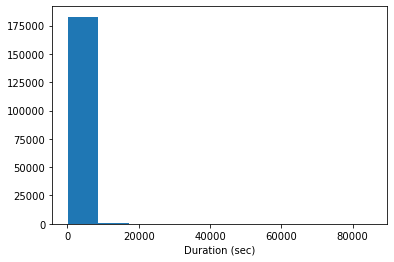

In [11]:
plt.hist(data=bike, x='duration_sec')
plt.xlabel('Duration (sec)')
plt.show()

#### What does the distribution of trip duration looks like?

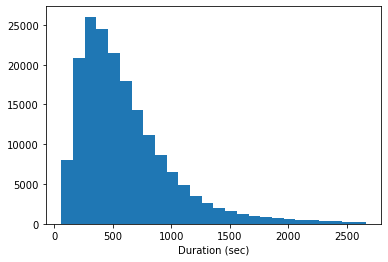

In [12]:
# limit the x-axis to 0-2700
bin_edges = np.arange(60, 2700, 100)
sb.distplot(bike['duration_sec'], bins = bin_edges, kde = False,
            hist_kws = {'alpha' : 1})
plt.xlabel('Duration (sec)')
plt.show()

In [13]:
bike[bike['duration_sec'] > 2700].duration_sec.count()/bike.duration_sec.count()

0.014993566396964211

>  The duration has a long-tailed distribution with only 1.5% of the rides lasts longer than 2700 sec (45min), which is the rental limit for subscribers (30min for non-subscribers). Most of the trip durations are around 500 sec (8min), seems like a good amount of time for commute or running errands. 

#### What are the distribution of bike rental start time looks like? Do users rent more frequently during commute hours?

In [14]:
bike['start_hour'] = bike.start_time.astype(str).str[:2]

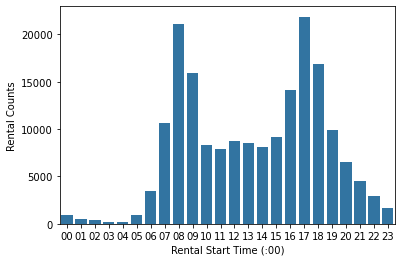

In [15]:
# popular hours
base_color = sb.color_palette()[0]
sb.countplot(data=bike, x='start_hour', color=base_color);
plt.xlabel('Rental Start Time (:00)')
plt.ylabel('Rental Counts')
plt.show()

> The graph of rental start time suggests that most of the trips are started 8:00 and 17:00, which are the time for most of people go to work.

### Were there any unusual points? Did you need to perform any transformations?

> Trip durations are highly skewed to the right with an extremly long tail. I shorten the limit on the x-axile to 0-2700 sec (0-45min) considering subscribers can rent bikes for 45 free minutes per trip. I didn't perform any log transformation becuase there I'm not performing any prediction on the duration time and the right skewed distribution itself presents the intended answer.

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

> I extracted the hour from the start time to research the distribution of the trip start time. I did this to see if the most rental time concentrated to commute time.

## Bivariate Exploration

> I had a theory before that the shared bike trips happens during commute hours. I'm curious on where are the stations located. In this section, I researched about the geographic data (longitude and latitude) and created geographic heatmaps to further investigate user habbits for shared bike system in Feburary 2019, San Francisco. 

#### Do subscribers tends to ride bikes for longer time given the benefit of an extra 15 min?

In [16]:
# check if there is any null data
bike.user_type.isnull().sum(), bike.duration_sec.isnull().sum()

(0, 0)

In [17]:
bike.user_type.value_counts()/bike.user_type.count()

Subscriber    0.891676
Customer      0.108324
Name: user_type, dtype: float64

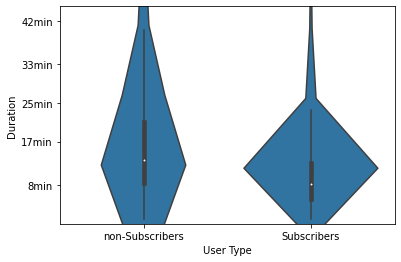

In [18]:
ax2=sb.violinplot(data=bike, x='user_type', y='duration_sec', color=base_color);
ax2.set(ylim=(0, 2700), yticks = [480, 1020, 1500, 1980, 2520], yticklabels= ['8min', '17min', '25min', '33min', '42min'], xticklabels = ['non-Subscribers','Subscribers'])
ax2.set(ylabel='Duration', xlabel='User Type')
plt.show()

> We have data for 163.5k subscriber and 19.9k non-subscribers. Most users ride 12-13min despite s/he is a subscriber or not. Surprisingly, subscribers on average took a shorter ride than non-subscribers.

#### Where does the rental stations located?

In [19]:
# Install the package for integrated map
! pip install pandas folium
import folium
from folium import plugins
from folium.plugins import HeatMap

  Using cached folium-0.11.0-py2.py3-none-any.whl (93 kB)
  Using cached branca-0.4.1-py3-none-any.whl (24 kB)


In [20]:
# plot the start station location on the map
m=folium.Map([37.550108, -122.265746], zoom_start=10)
hm_wide = HeatMap(
    list(zip(bike.start_station_latitude.values, bike.start_station_longitude.values)),
    min_opacity=0.2,
    radius=5, 
    blur=5, 
    max_zoom=1,
)

# plot heatmap
m.add_child(hm_wide)
m

> From the map, we can see that San Francisco's shared bike system has three centers - San Francisco downtown, Oakland, and Silicon Valley (plus San Jose).

#### Where are the top 10 most popular start station located?

In [21]:
# explore top 10 start location and duration
# extract the top 10 popular start stations' name (by count) and pull the related data from orginal dataframe
start_10=bike.start_station_name.value_counts().index.tolist()
start_10=start_10[0 : 10] 
bike_10 = bike.loc[bike['start_station_name'].isin(start_10)]

In [22]:
# calculate the sample size
bike_10.duration_sec.count()/bike.duration_sec.count()

0.1552297559592611

In [23]:
# where are the most popular stations located 
m2=folium.Map([37.741990, -122.422640], zoom_start=11)
hm_wide = HeatMap(
    list(zip(bike_10.start_station_latitude.values, bike_10.start_station_longitude.values)),
    min_opacity=0.2,
    radius=13, 
    blur=10, 
    max_zoom=1,
)

# plot heatmap
m2.add_child(hm_wide)
m2

> From the map, we learn that the top 10 popular stations are all from San Francisco downtown area. 

#### How long do the trips last for the top 10 stations? Is there any pattern？ 

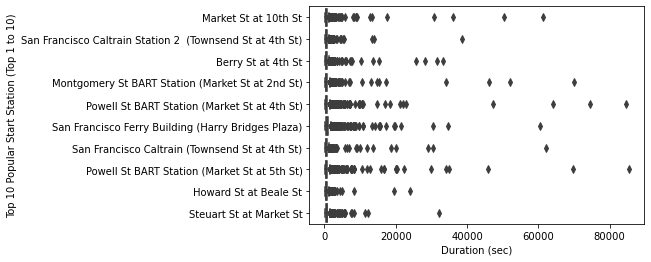

In [24]:
# explore the trip duration distribution of the 10 stations
sb.boxplot(data=bike_10, x='duration_sec', y='start_station_name', order=start_10)
plt.xlabel('Duration (sec)')
plt.ylabel('Top 10 Popular Start Station (Top 1 to 10)')
plt.show()

> Similar to what we have found previously that the duratation data are highly skewed to the right, we need to zoom in to learn more information.

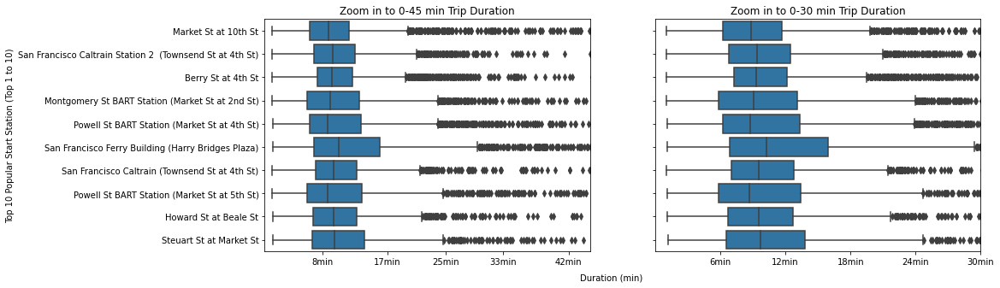

In [25]:
# the duration has a long tail, explore the duration time below 45 min (2700 sec) and below 30 min (1800 sec)

fig = plt.figure(figsize = [15, 5])
base_color = sb.color_palette()[0]

plt.subplot(1,2,1)
ax1=sb.boxplot(data=bike_10, y='start_station_name', x='duration_sec', color=base_color, order=start_10)
ax1.set(xlim=(0, 2700), xticks = [480, 1020, 1500, 1980, 2520], xticklabels= ['8min', '17min', '25min', '33min', '42min'], 
        ylabel = 'Top 10 Popular Start Station (Top 1 to 10)', title = 'Zoom in to 0-45 min Trip Duration', xlabel = None)

plt.subplot(1,2,2)
ax2=sb.boxplot(data=bike_10, y='start_station_name', x='duration_sec', color=base_color, order=start_10)
ax2.set(xlim=(0, 1800), xticks = [360, 720, 1080, 1440, 1800], xticklabels= ['6min', '12min', '18min', '24min', '30min'], 
        yticklabels = [], ylabel=None, title = 'Zoom in to 0-30 min Trip Duration', xlabel=None)

fig.text(0.5, 0.04, 'Duration (min)', ha='center', va='center')

plt.show()

> I chose to zoom in the duration to 0-45 min and 0-30 min, and the graph showed that trips starting from the 10 stations mostly last 6-15 min with the average trip duration of around 10mins. Trips starts from San Francisco Ferry Building Station seems to have longer duration time than other popular stations.

#### Where do most of the trips end for the top 10 start stations?

In [26]:
# Further investigate the trip durations within 6-15 min (180-900 sec)
bike_10_615 = bike_10.loc[(bike_10['duration_sec'] > 179 ) & (bike_10['duration_sec'] < 901)]

In [27]:
bike_10_615.duration_sec.count()/bike_10.duration_sec.count()

0.7962488145832601

In [28]:
# where does most trip ends from the most popular 10 start station 
m3=folium.Map([37.741990, -122.422640], zoom_start=12)
hm_wide = HeatMap(
    list(zip(bike_10_615.end_station_latitude.values, bike_10_615.end_station_longitude.values)),
    min_opacity=0.2,
    radius=13, 
    blur=10, 
    max_zoom=1,
)

# plot heatmap
m3.add_child(hm_wide)
m3

> From the most popular 10 stations, trips' (duration ranges 6-15 mins) ending stations spread out in the the San Francisco downtown area. 

#### When do these trips usually start?

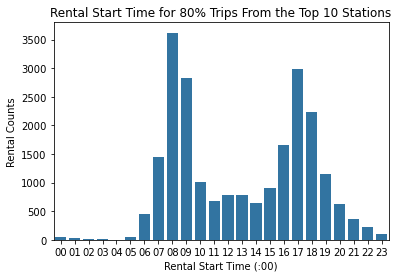

In [29]:
# Take a look at when does these trip usually happens
sb.countplot(data=bike_10_615, x='start_hour', color=base_color)
plt.xlabel('Rental Start Time (:00)')
plt.ylabel('Rental Counts')
plt.title('Rental Start Time for 80% Trips From the Top 10 Stations')
plt.show()

> On a further investigation of the rental start time, most of the trips happened on 8:00 and 17:00, similar to the commute time.

## Multivariate Exploration

> I created a facet group graph to further investigate the trips patterns in each top 10 start stations. 

#### How does the trip start time distribute differently for the top 10 start stations?

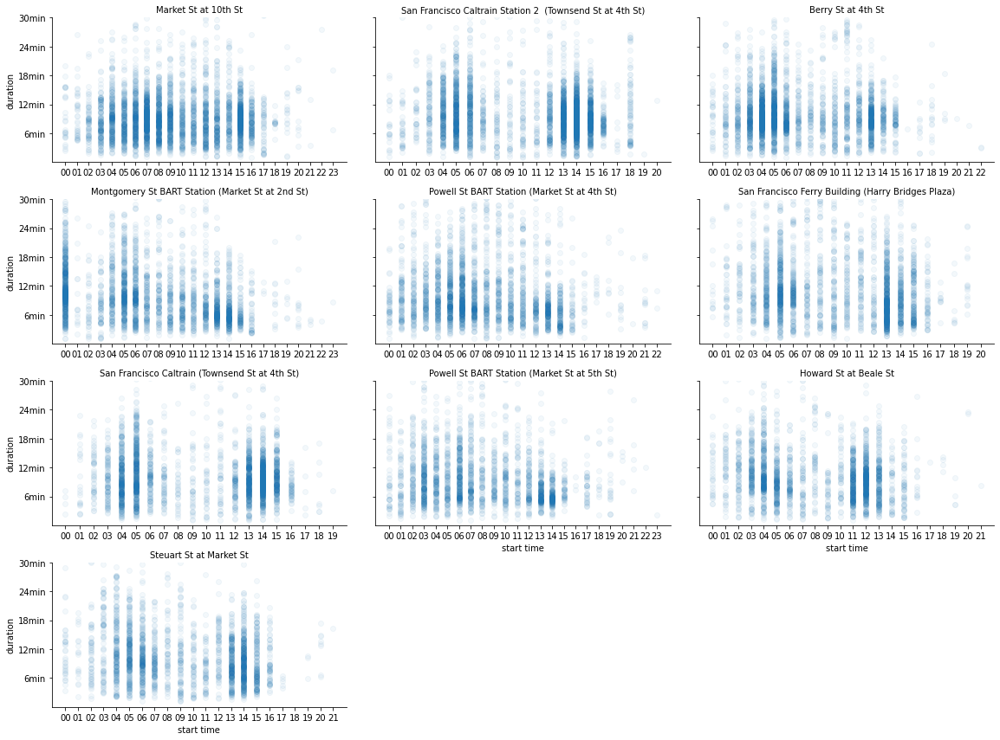

In [40]:
time=bike_10['start_hour'].sort_values().drop_duplicates().to_list()

# explore relationship among time, duration, and the top 10 start stations
g = sb.FacetGrid(data = bike_10, col = 'start_station_name', height = 3, aspect = 1.8, col_wrap=3, col_order = start_10, sharex=False)
g.map(plt.scatter, 'start_hour', 'duration_sec', alpha=1/20)
g.set(ylim=(0, 1800), yticks = [360, 720, 1080, 1440, 1800], yticklabels= ['6min', '12min', '18min', '24min', '30min'], xticklabels=time)
g.set_axis_labels("start time", "duration")
plt.setp(g.fig.texts, text="")
g.set_titles(row_template="{row_name}", col_template="{col_name}")
plt.show()

> Despite that the entire sample set suggests that the top 10 stations are in particular popular among usual commute time, namely 8:00 and 17:00, each station is different. Market St & 10th St is popular during daytime, suggesting that the station might be located at a popular tourism site or among office buildings; Caltrain Stations (& 2) are mostly popular at 5:00 and 14:00, maybe due to people commuting in the form of both train and bike. 

> 12:00, 13:00 and 14:00 are popular time when people unlock the bikes, which trips could be used to go to lunches. 